<a href="https://colab.research.google.com/github/i-suhas/Autism-spectrum-disorder/blob/main/ASD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
print(os.listdir('/content/'))

['.config', 'drive', 'sample_data']


In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = (224, 224)
batch_size = 32

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_gen = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/ASD-COLAB/autism/train',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

val_gen = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/ASD-COLAB/autism/valid',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

Found 2022 images belonging to 2 classes.
Found 40 images belonging to 2 classes.


In [60]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define directory paths
train_dir = '/content/drive/MyDrive/ASD-COLAB/autism/train'
validation_dir = '/content/drive/MyDrive/ASD-COLAB/autism/valid'

# Create data generators with more data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.5, 1.5], # Add brightness augmentation
    channel_shift_range=100 # Add channel shift augmentation
)

validation_datagen = ImageDataGenerator(rescale=1./255) # Typically no augmentation on validation data

# Load images from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    color_mode='rgb',
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    color_mode='rgb',
    shuffle=False
)

Found 2526 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


## Modify vgg19 for autism detection


Adapt the VGG19 model for the specific task of autism detection. This might involve adding new layers for classification or fine-tuning existing layers.


**Reasoning**:
I need to adapt the VGG19 base model for binary classification by adding new layers on top of it. This involves creating a sequential model, adding the base model, flattening its output, adding dense layers with ReLU activation, potentially a dropout layer, and a final dense layer with sigmoid activation for binary output.freezed the weights of the base model initially for stability.



In [61]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam # Import Adam optimizer

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Unfreeze the last few layers of the base model for fine-tuning
# You can adjust the number of layers to unfreeze
for layer in base_model.layers[:]: # Unfreeze all layers initially, we'll set trainable=False for early layers later
    layer.trainable = True


model = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Set the early layers of the base model to non-trainable again
# You can adjust how many layers to keep frozen
# A common practice is to unfreeze the last few convolutional blocks
num_frozen_layers = 15 # Example: Keep the first 15 layers frozen (adjust as needed)
for layer in base_model.layers[:num_frozen_layers]:
    layer.trainable = False


# Compile the model with a lower learning rate for fine-tuning
model.compile(optimizer=Adam(learning_rate=1e-5), # Use a small learning rate
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ (None, 7, 7, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,447,425 (100.89 MB)

 Trainable params: 18,222,081 (69.51 MB)

 Non-trainable params: 8,225,344 (31.38 MB)

In [62]:
history = model.fit(train_gen, validation_data=val_gen, epochs=8)


Epoch 1/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1898s 30s/step - accuracy: 0.6293 - loss: 0.6502 - val_accuracy: 0.7750 - val_loss: 0.4825
Epoch 2/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1873s 29s/step - accuracy: 0.7938 - loss: 0.4366 - val_accuracy: 0.7750 - val_loss: 0.4547
Epoch 3/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1873s 29s/step - accuracy: 0.8596 - loss: 0.3406 - val_accuracy: 0.7500 - val_loss: 0.4383
Epoch 4/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1866s 29s/step - accuracy: 0.8811 - loss: 0.2903 - val_accuracy: 0.7500 - val_loss: 0.4160
Epoch 5/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1883s 29s/step - accuracy: 0.9113 - loss: 0.2315 - val_accuracy: 0.7500 - val_loss: 0.4755
Epoch 6/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1882s 29s/step - accuracy: 0.9397 - loss: 0.1614 - val_accuracy: 0.8000 - val_loss: 0.4226
Epoch 7/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1883s 29s/step - accuracy: 0.9538 - loss: 0.1313 - val_accuracy: 0.7250 - val_loss: 0.5293
Epoch 8/8
64/64 ━━━━━━━━━━━━━━━━━━━━ 1880s 29s/step - accuracy: 0.9720 - loss: 0.1069 - val_accuracy: 0.

Found 200 images belonging to 2 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


200/200 ━━━━━━━━━━━━━━━━━━━━ 131s 649ms/step
Image: autistic/001.jpg --> Prediction: non_autistic
Image: autistic/002.jpg --> Prediction: autistic
Image: autistic/003.jpg --> Prediction: autistic
Image: autistic/004.jpg --> Prediction: non_autistic
Image: autistic/005.jpg --> Prediction: non_autistic
Image: autistic/006.jpg --> Prediction: autistic
Image: autistic/007.jpg --> Prediction: autistic
Image: autistic/008.jpg --> Prediction: autistic
Image: autistic/009.jpg --> Prediction: non_autistic
Image: autistic/010.jpg --> Prediction: autistic
Image: autistic/011.jpg --> Prediction: autistic
Image: autistic/012.jpg --> Prediction: autistic
Image: autistic/013.jpg --> Prediction: autistic
Image: autistic/014.jpg --> Prediction: autistic
Image: autistic/015.jpg --> Prediction: autistic
Image: autistic/016.jpg --> Prediction: autistic
Image: autistic/017.jpg --> Prediction: autistic
Image: autistic/018.jpg --> Prediction: non_autistic
Image: autistic/019.jpg --> Prediction: autistic
Imag

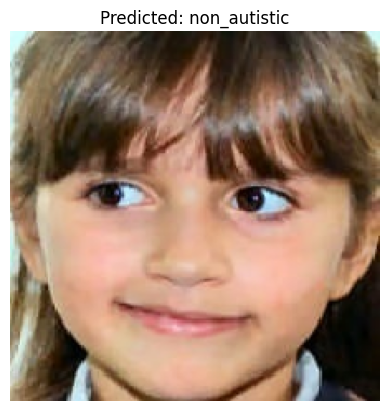

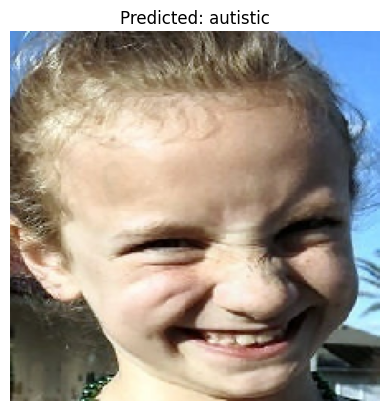

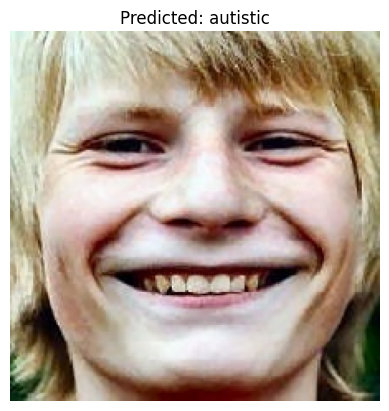

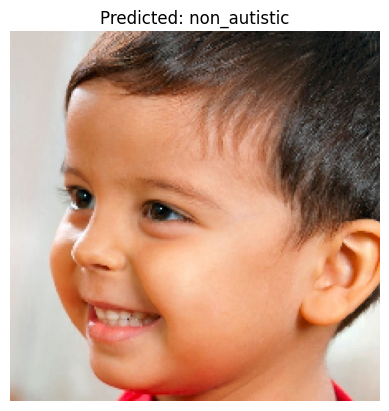

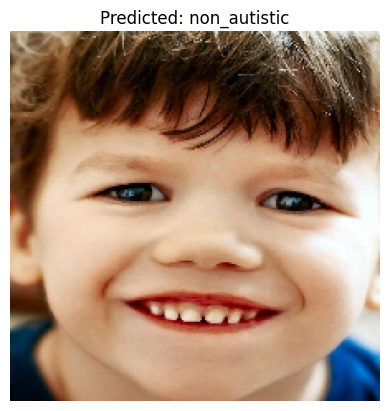

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Define test directory
test_dir = '/content/drive/MyDrive/ASD-COLAB/autism/test'

# Create a test generator (no augmentation, just rescale)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=1,         # one image at a time for prediction
    class_mode=None,      # no labels, only data
    shuffle=False         # important to keep filenames aligned with predictions
)

# Get predictions
predictions = model.predict(test_generator, verbose=1)

# Convert sigmoid outputs into binary classes (0 or 1)
predicted_classes = (predictions > 0.5).astype("int32")

# Map class indices back to class labels
class_indices = train_generator.class_indices
labels = {v: k for k, v in class_indices.items()}  # reverse mapping

# Display predictions with filenames
for i, fname in enumerate(test_generator.filenames):
    print(f"Image: {fname} --> Prediction: {labels[predicted_classes[i][0]]}")

# OPTIONAL: visualize first few test results
for i in range(5):
    img_path = os.path.join(test_dir, test_generator.filenames[i])
    img = image.load_img(img_path, target_size=(224,224))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {labels[predicted_classes[i][0]]}")
    plt.show()


In [68]:
# Thank you


 ## Analyze misclassifications
#
#  Images that the model is misclassifying are analysed to  identify
# patterns or characteristics that the model is struggling with by
#comparing the true and predicted labels and then display these images along
# with their true and predicted classes to observe patterns.

## Analyze misclassifications

### Subtask:
Examine the images that the model is misclassifying to identify patterns or characteristics that the model is struggling with.


**Reasoning**:
I need to identify the misclassified images by comparing the true and predicted labels and then display these images along with their true and predicted classes to observe patterns.



Found 45 misclassified images.
Image: 012.jpg
True class: autistic
Predicted class: non_autistic


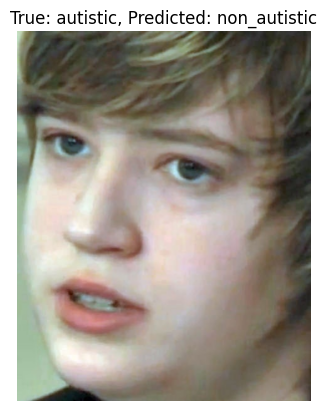

------------------------------
Image: 013.jpg
True class: autistic
Predicted class: non_autistic


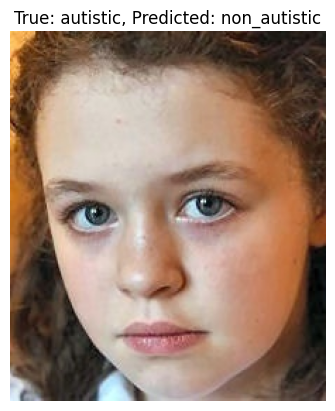

------------------------------
Image: 038.jpg
True class: autistic
Predicted class: non_autistic


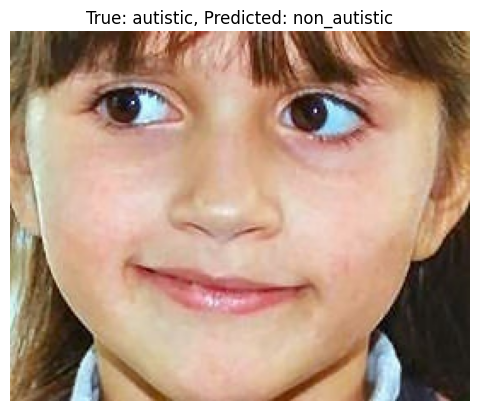

------------------------------
Image: 050.jpg
True class: autistic
Predicted class: non_autistic


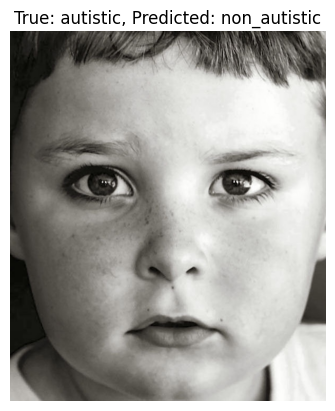

------------------------------
Image: 053.jpg
True class: autistic
Predicted class: non_autistic


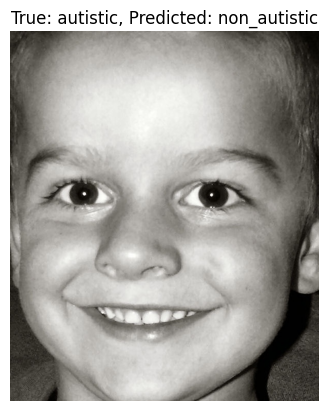

------------------------------
Image: 059.jpg
True class: autistic
Predicted class: non_autistic


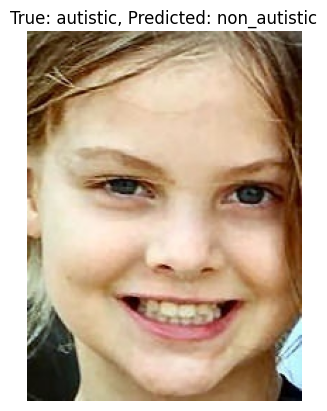

------------------------------
Image: 074.jpg
True class: autistic
Predicted class: non_autistic


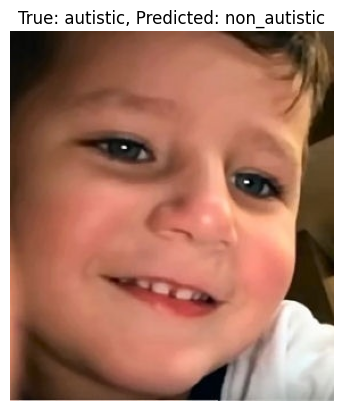

------------------------------
Image: 080.jpg
True class: autistic
Predicted class: non_autistic


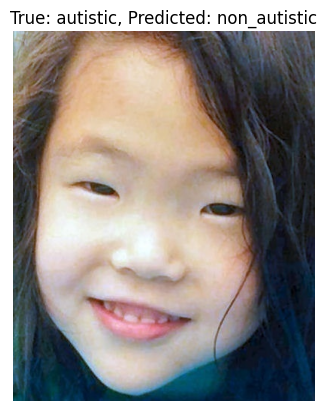

------------------------------
Image: 082.jpg
True class: autistic
Predicted class: non_autistic


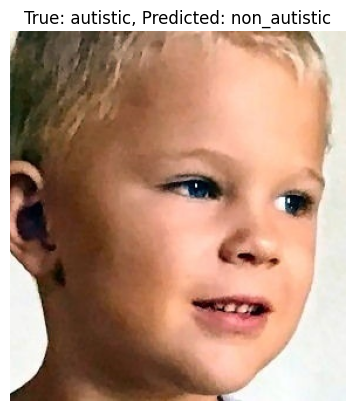

------------------------------
Image: 087.jpg
True class: autistic
Predicted class: non_autistic


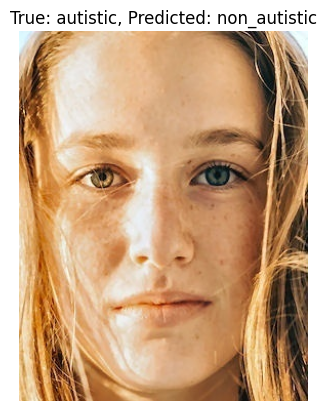

------------------------------
Image: 095.jpg
True class: autistic
Predicted class: non_autistic


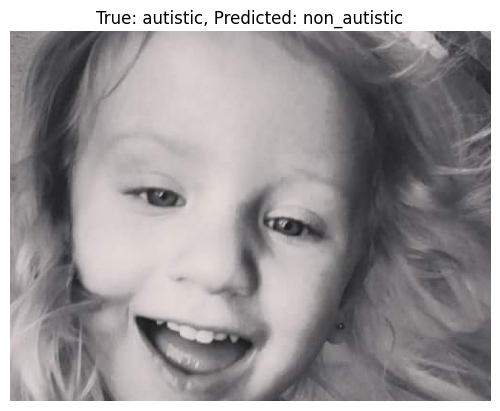

------------------------------
Image: 001.jpg
True class: non_autistic
Predicted class: autistic


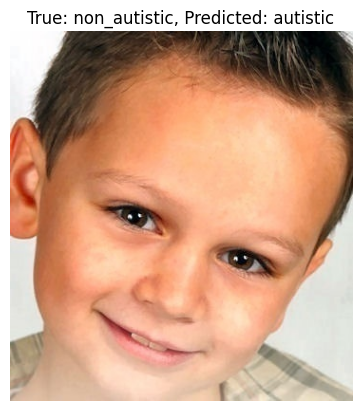

------------------------------
Image: 003.jpg
True class: non_autistic
Predicted class: autistic


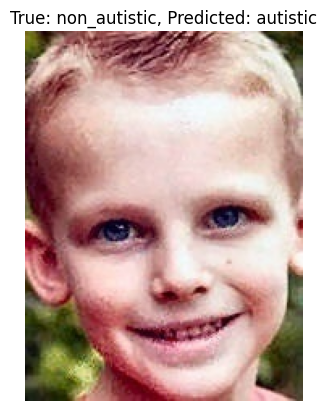

------------------------------
Image: 008.jpg
True class: non_autistic
Predicted class: autistic


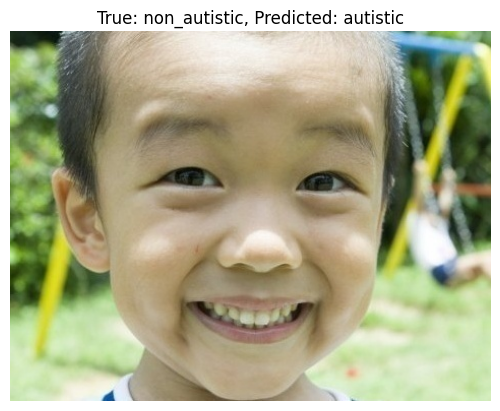

------------------------------
Image: 011.jpg
True class: non_autistic
Predicted class: autistic


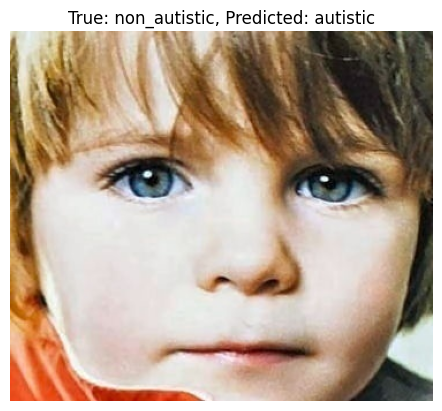

------------------------------
Image: 013.jpg
True class: non_autistic
Predicted class: autistic


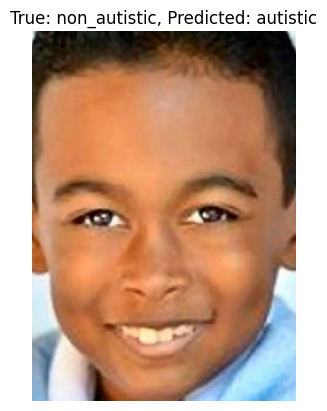

------------------------------
Image: 014.jpg
True class: non_autistic
Predicted class: autistic


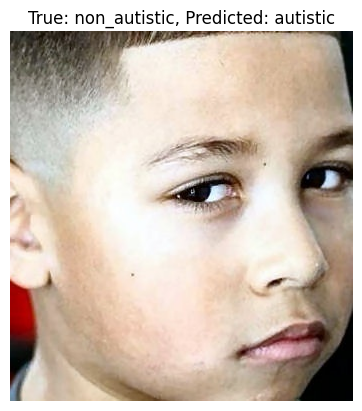

------------------------------
Image: 016.jpg
True class: non_autistic
Predicted class: autistic


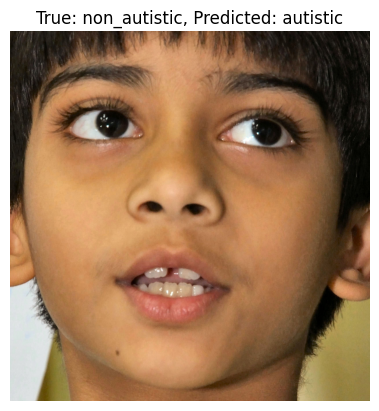

------------------------------
Image: 020.jpg
True class: non_autistic
Predicted class: autistic


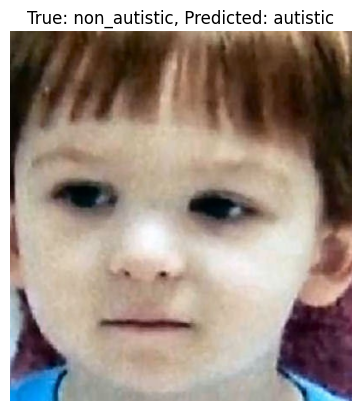

------------------------------
Image: 025.jpg
True class: non_autistic
Predicted class: autistic


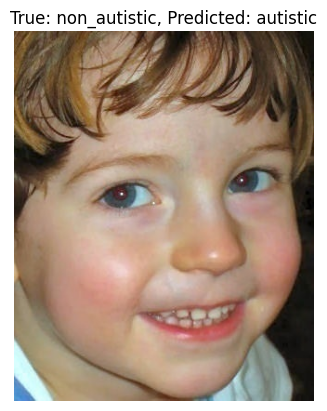

------------------------------
Image: 026.jpg
True class: non_autistic
Predicted class: autistic


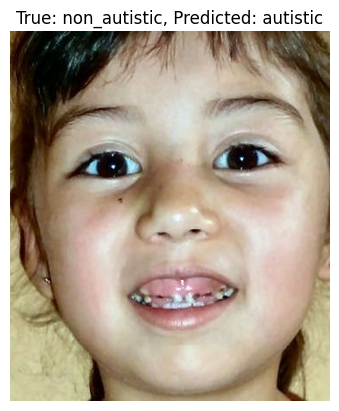

------------------------------
Image: 027.jpg
True class: non_autistic
Predicted class: autistic


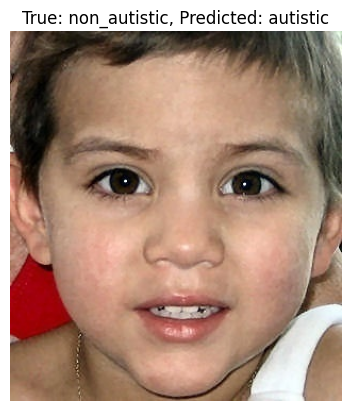

------------------------------
Image: 030.jpg
True class: non_autistic
Predicted class: autistic


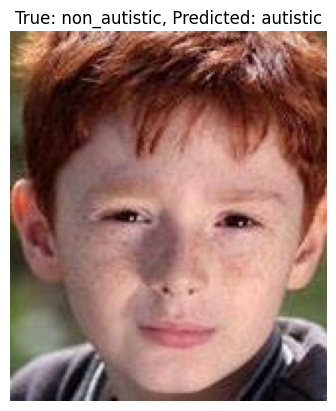

------------------------------
Image: 032.jpg
True class: non_autistic
Predicted class: autistic


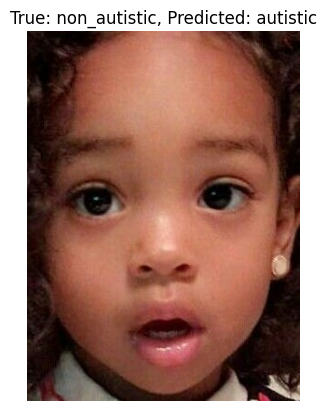

------------------------------
Image: 035.jpg
True class: non_autistic
Predicted class: autistic


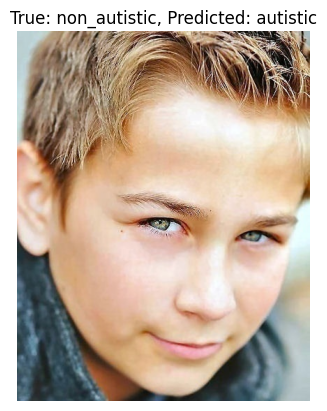

------------------------------
Image: 036.jpg
True class: non_autistic
Predicted class: autistic


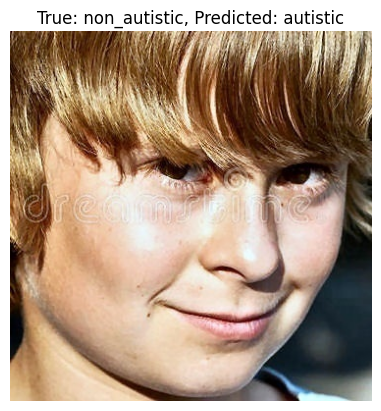

------------------------------
Image: 043.jpg
True class: non_autistic
Predicted class: autistic


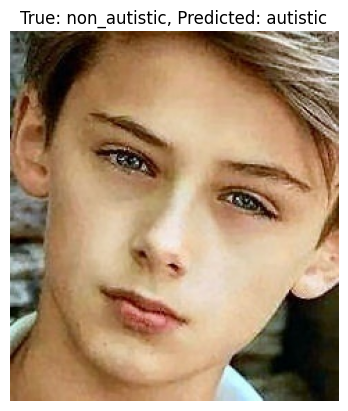

------------------------------
Image: 044.jpg
True class: non_autistic
Predicted class: autistic


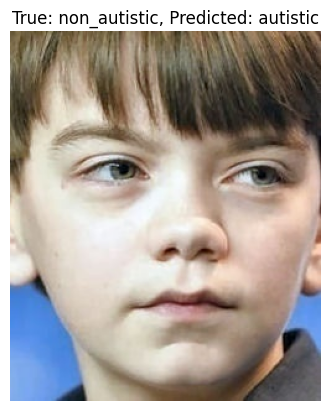

------------------------------
Image: 048.jpg
True class: non_autistic
Predicted class: autistic


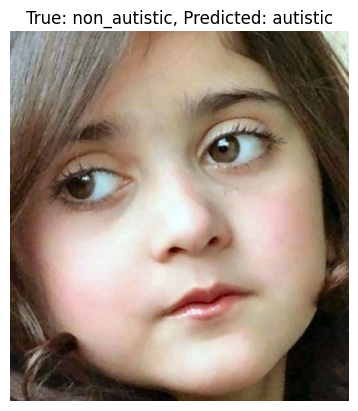

------------------------------
Image: 049.jpg
True class: non_autistic
Predicted class: autistic


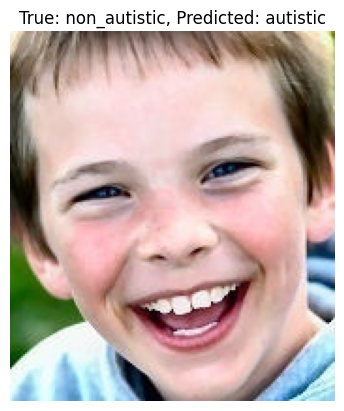

------------------------------
Image: 050.jpg
True class: non_autistic
Predicted class: autistic


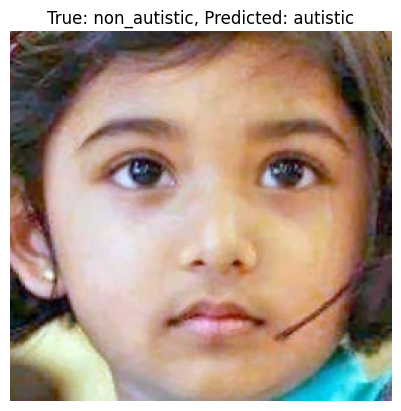

------------------------------
Image: 051.jpg
True class: non_autistic
Predicted class: autistic


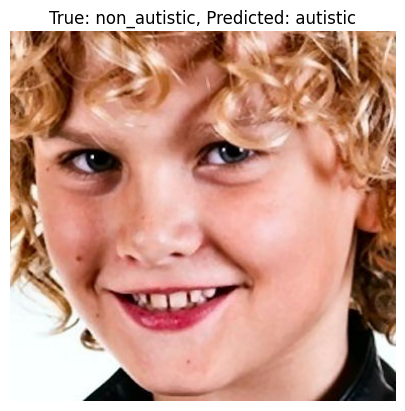

------------------------------
Image: 053.jpg
True class: non_autistic
Predicted class: autistic


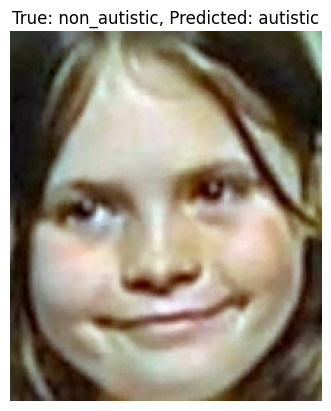

------------------------------
Image: 056.jpg
True class: non_autistic
Predicted class: autistic


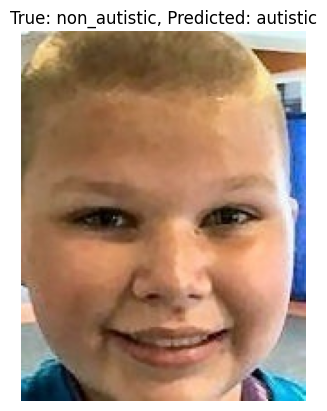

------------------------------
Image: 060.jpg
True class: non_autistic
Predicted class: autistic


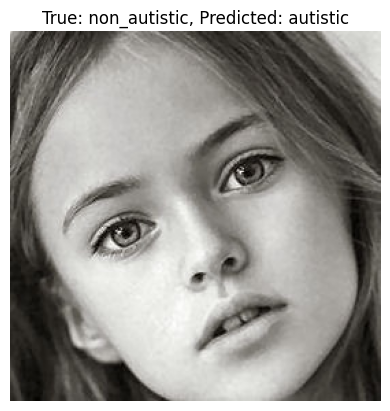

------------------------------
Image: 062.jpg
True class: non_autistic
Predicted class: autistic


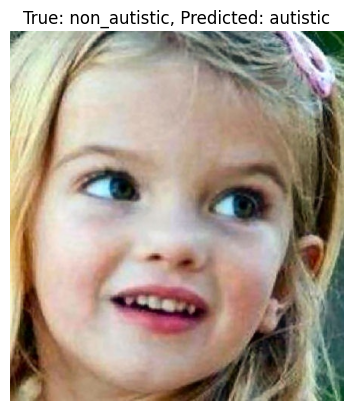

------------------------------
Image: 065.jpg
True class: non_autistic
Predicted class: autistic


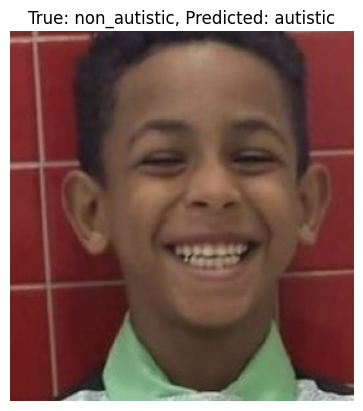

------------------------------
Image: 068.jpg
True class: non_autistic
Predicted class: autistic


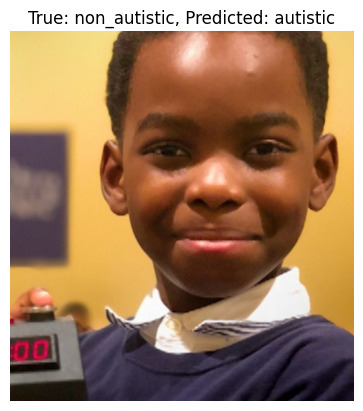

------------------------------
Image: 074.jpg
True class: non_autistic
Predicted class: autistic


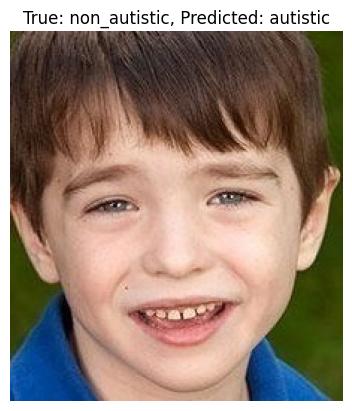

------------------------------
Image: 075.jpg
True class: non_autistic
Predicted class: autistic


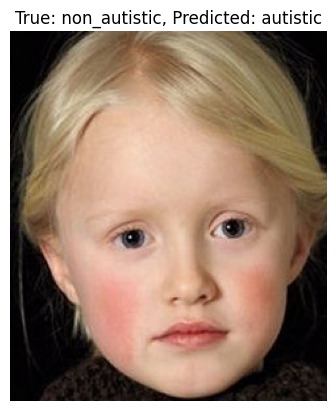

------------------------------
Image: 077.jpg
True class: non_autistic
Predicted class: autistic


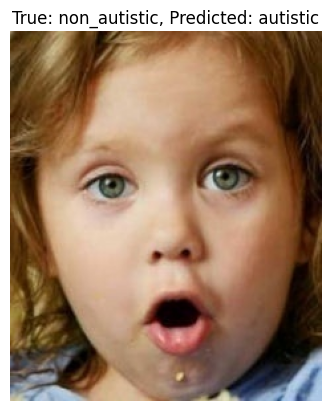

------------------------------
Image: 082.jpg
True class: non_autistic
Predicted class: autistic


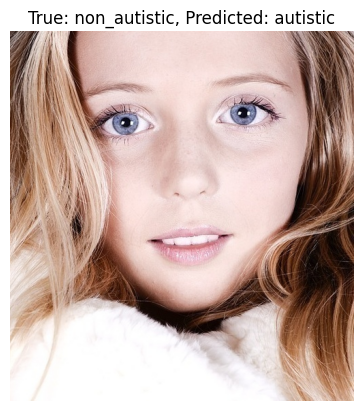

------------------------------
Image: 084.jpg
True class: non_autistic
Predicted class: autistic


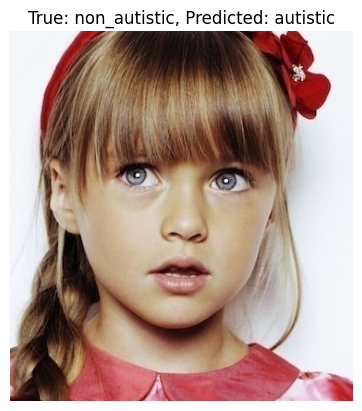

------------------------------
Image: 086.jpg
True class: non_autistic
Predicted class: autistic


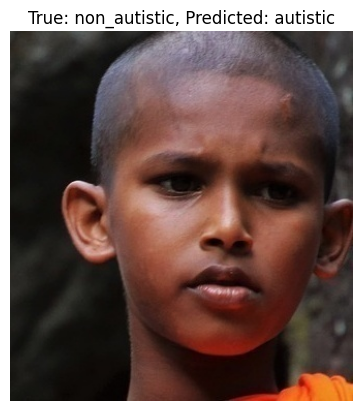

------------------------------
Image: 091.jpg
True class: non_autistic
Predicted class: autistic


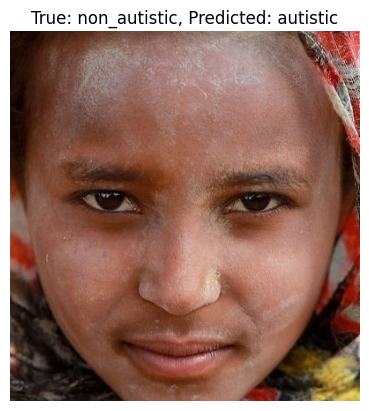

------------------------------


In [53]:
import matplotlib.pyplot as plt
import os

# Identify misclassified indices
misclassified_indices = np.where(y_pred.flatten() != y_true)[0]

print(f"Found {len(misclassified_indices)} misclassified images.")

# Iterate through misclassified indices and display images
for i in misclassified_indices:
    # Get image path
    img_path = validation_generator.filepaths[i]

    # Get true and predicted labels
    true_label = class_names[y_true[i]]
    predicted_label = class_names[y_pred[i][0]]

    print(f"Image: {os.path.basename(img_path)}")
    print(f"True class: {true_label}")
    print(f"Predicted class: {predicted_label}")

    # Load and display image
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.title(f"True: {true_label}, Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()
    print("-" * 30) # Separator for clarity
